# Imports....

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install patchify
!pip install albumentations==0.4.6

     |████████████████████████████████| 117 kB 9.8 MB/s 
     |████████████████████████████████| 948 kB 49.2 MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65172 sha256=bd8b288575f451e881df587d0ddca42ec9d539be7941fca10f1847ec23d50064
  Stored in directory: /root/.cache/pip/wheels/cf/34/0f/cb2a5f93561a181a4bcc84847ad6aaceea8b5a3127469616cc
Successfully built albumentations
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
import os
import copy
import shutil
from glob import glob
import numpy as np
from collections import OrderedDict
import matplotlib.pyplot as plt
from tqdm import tqdm
import enum
from skimage.transform import resize
import time
from scipy import stats
import random
from IPython import display
import scipy.io
import cv2
from PIL import Image
from patchify import patchify
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.utils import to_categorical
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

from tensorflow.keras.utils import Sequence
import numpy as np 
import os
import skimage.io as io
import skimage.transform as trans
import numpy as np
import tensorflow  as tf
from tensorflow import keras
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as K
from tensorflow.keras.losses import binary_crossentropy

import albumentations as A
from albumentations.pytorch import ToTensorV2
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

In [ ]:
scaler = MinMaxScaler()

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Dataset....

In [ ]:
def make_list(s):
  l = sorted(os.listdir(s))
  return l

In [ ]:
imagesTr  = '/content/drive/Shareddrives/Classification/consep/CoNSeP/New_Data/Train/train_img'
imagesTs  = '/content/drive/Shareddrives/Classification/consep/CoNSeP/New_Data/test/test_images'
labelsTr  = '/content/drive/Shareddrives/Classification/consep/CoNSeP/New_Data/Train/train_mask'
labelsTs = '/content/drive/Shareddrives/Classification/consep/CoNSeP/New_Data/test/test_masks'

In [ ]:
images_train = make_list(imagesTr)
masks_train = make_list(labelsTr)
images_test = make_list(imagesTs)
masks_test = make_list(labelsTs)

In [ ]:
#list of img and mask path......TRAIN
img_train_paths = []
mask_train_paths = []
#list of img and mask path......TEST
img_test_paths = []
mask_test_paths = []


for idx in range(len(images_train)):
  img_train_paths.append(os.path.join(imagesTr, images_train[idx]))
  mask_train_paths.append(os.path.join(labelsTr, masks_train[idx]))

for idx in range(len(images_test)):
  img_test_paths.append(os.path.join(imagesTs, images_test[idx]))
  mask_test_paths.append(os.path.join(labelsTs, masks_test[idx]))

len(img_train_paths), len(mask_train_paths), len(img_test_paths), len(mask_test_paths)

(243, 243, 126, 126)

In [ ]:
train_images = img_train_paths + img_test_paths
train_masks = mask_train_paths + mask_test_paths

In [ ]:
len(train_images)

369

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(train_images, train_masks, test_size = 0.2, shuffle = True, random_state = 42)

In [ ]:
class_values = {"1": "other",
                "2": "inflammatory",
                "3": "healthy epithelial",
                "4": "dysplastic/malignant epithelial",
                "5": "fibroblast",
                "6": "muscle",
                "7": "endothelial"}

color_values = {0: [255, 255, 255],
                1: [207, 63, 83],
                2: [98, 115, 102],
                3: [85, 20, 232],
                4: [84, 138, 133],
                5: [84, 163, 247],
                6: [3, 64, 114],
                7: [27, 222, 191]}

In [ ]:
# import scipy.io
# import numpy as np
# from tensorflow.keras.utils import to_categorical
# import matplotlib.pyplot as plt

# def onehot_to_rgb(onehot, colormap = color_values):
#     single_layer = np.argmax(onehot, axis=-1)
#     output = np.zeros(onehot.shape[:2]+(3,))
#     for k in colormap.keys():
#         output[single_layer==k] = colormap[k]
#     return np.uint8(output)

# import os
# import cv2
# mask_dir = "D:/punikit/CoNSeP/Test/Labels"
# dest_dir = "D:/punikit/CoNSeP/Test/Masks"

# masks = os.listdir(mask_dir)
# for mask in masks:
#     mat = scipy.io.loadmat(os.path.join(mask_dir, mask))
#     mat = mat["type_map"]
#     mat = to_categorical(mat, num_classes=8, dtype="float32")
#     mat = onehot_to_rgb(mat)
#     cv2.imwrite(os.path.join(dest_dir, os.path.splitext(mask)[0] + ".png"), mat)

In [ ]:
aug = A.Compose([      
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.4),
    A.Transpose(p=0.5),          
    A.RandomRotate90(p=0.5),
    A.GridDistortion(p=0.3),
    A.OpticalDistortion(distort_limit=2, shift_limit=0.5, p=0.5),
    A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    A.RandomBrightnessContrast(p=0.4),    
    A.RandomGamma(p=0.5)
    ])

In [ ]:
def rgb_to_onehot(rgb_arr, color_dict = color_values):
    num_classes = len(color_dict)
    shape = rgb_arr.shape[:2]+(num_classes,)
    arr = np.zeros( shape, dtype=np.float32 )
    for i, cls in enumerate(color_dict):
        arr[:,:,i] = np.all(rgb_arr.reshape( (-1,3) ) == color_dict[i], axis=1).reshape(shape[:2])
    return arr

In [ ]:
def encoding(y):
    d = np.zeros((1, 7)).astype(np.float32)
    uniq = np.unique(np.argmax(y, axis =-1))
    for i in uniq[1:]:
        d[0][i-1] = 1.0
    return d.astype(np.float32)


class CoNSePDataset(Sequence):
  def __init__(self, img_paths=None, mask_paths=None, a = True):
    self.img_paths = img_paths
    self.mask_paths = mask_paths
    self.a = a
    self.transform = aug
    assert len(self.img_paths) == len(self.mask_paths)
    self.images = len(self.img_paths) #list all the files present in that folder...
  
  def __len__(self):
    return len(self.img_paths) #length of dataset
  
  def __getitem__(self, index):
    img_path = self.img_paths[index]
    mask_path = self.mask_paths[index]
    image = cv2.imread(img_path)
    mask = cv2.imread(mask_path)

    if self.a:
        augment = self.transform(image = image, mask=mask)
        image = augment['image']
        mask = augment['mask']

    image = image.astype(np.float32)
    image = image/255.0
    # image = torch.from_numpy(image)

    
    mask = mask.astype(np.float32)
    mask = rgb_to_onehot(mask)
    mask = mask.astype(np.float32)
    mask = np.expand_dims(mask, axis = 0)

    return np.expand_dims(image, axis = 0), mask

In [ ]:
train_ds = CoNSePDataset(
        img_paths=x_train,
        mask_paths=y_train,
        a = True
    )
# val_ds = CoNSePDataset(
#         img_paths=img_val_paths,
#         mask_paths=mask_val_paths,
#     )
test_ds = CoNSePDataset(
        img_paths=x_test,
        mask_paths=y_test,
        a = False)

In [ ]:
for i, data in enumerate(train_ds):
    x = data[0]
    y = data[1]
    
    print(x.dtype, y.dtype)
    break

float32 float32


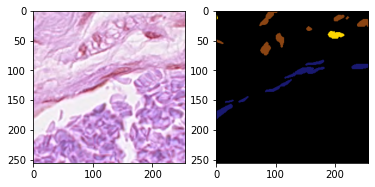

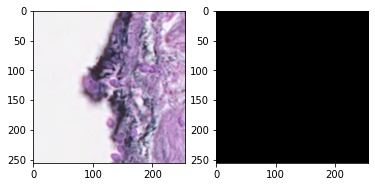

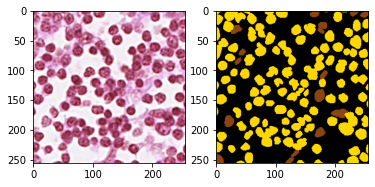

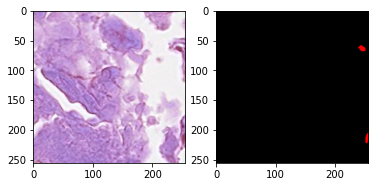

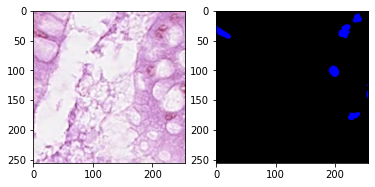

...

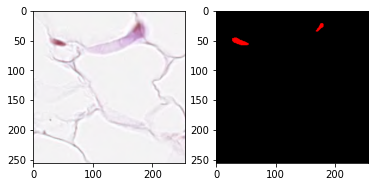

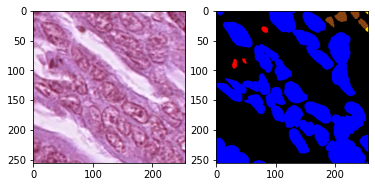

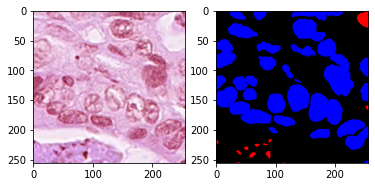

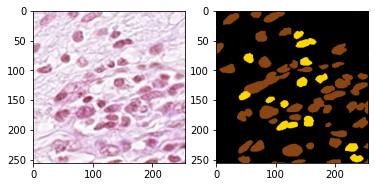

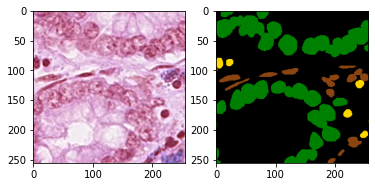

KeyboardInterrupt: ignored

In [ ]:
import time
for i, data in enumerate(train_ds):
    one = data[1][0]
    x = onehot_to_rgb(one)
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(data[0][0])
    
    ax[1].imshow(x)
    plt.show()

In [ ]:

# def diceCoef(y_true, y_pred):   
#     smooth = 1.
#     y_true_f = K.flatten(y_true)    
#     y_pred_f = K.flatten(y_pred)    
#     intersection = K.sum(y_true_f * y_pred_f)    
#     return (2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)


# def diceCoefLoss(y_true, y_pred):
#     return 1.-diceCoef(y_true, y_pred)

# def bce_dice_loss(y_true, y_pred):
#     loss = binary_crossentropy(y_true, y_pred) + diceCoefLoss(y_true, y_pred)
#     return loss


# def unet(pretrained_weights = None, input_size = (256,256,3)):
#     inputs = Input(shape = input_size)
#     conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
#     conv1 = SeparableConv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
#     conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
#     conv2 = SeparableConv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
#     conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
#     conv3 = SeparableConv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
#     conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
#     conv4 = SeparableConv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
#     drop4 = Dropout(0.5)(conv4)
#     pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

#     conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
#     conv5 = SeparableConv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
#     drop5 = Dropout(0.5)(conv5)

#     # out = GlobalAveragePooling2D()(drop5)
#     # out = Flatten()(out)
#     # out = Dense(7, activation='sigmoid', name = 'classification')(out)

#     up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
#     merge6 = concatenate([drop4,up6], axis = 3)
#     conv6 = SeparableConv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
#     conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

#     up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
#     merge7 = concatenate([conv3,up7], axis = 3)
#     conv7 = SeparableConv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
#     conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

#     up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
#     merge8 = concatenate([conv2,up8], axis = 3)
#     conv8 = SeparableConv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
#     conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

#     up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
#     merge9 = concatenate([conv1,up9], axis = 3)
#     conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
#     conv9 = SeparableConv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
#     conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
#     conv10 = Conv2D(8, 1, activation = 'softmax', name = 'segmentation')(conv9)

#     model = Model(inputs = inputs, outputs = conv10)

#     model.compile(optimizer = Adam(learning_rate = 1e-4), 
#                   loss = {'segmentation':bce_dice_loss},
#                   metrics = {'segmentation':['accuracy', diceCoef]}
#                   )
    
#     #model.summary()

#     if(pretrained_weights):
#     	model.load_weights(pretrained_weights)

#     return model

# New Section

In [ ]:
from tensorflow.keras import backend as K


def downsample_image(x,shape):
    return tf.image.resize(x,[shape,shape])

def diceCoef(y_true, y_pred):   
    smooth = 1.
    y_true_f = K.flatten(y_true)    
    y_pred_f = K.flatten(y_pred)    
    intersection = K.sum(y_true_f * y_pred_f)    
    return (2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)


def diceCoefLoss(y_true, y_pred):
    return 1.-diceCoef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + diceCoefLoss(y_true, y_pred)
    return loss


def unet(pretrained_weights = None, input_size = (256,256,3)):
    inputs = Input(shape = input_size)
    
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = SeparableConv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
            #(128, 128, 64)

    down1 = downsample_image(inputs, 128)
    conv_d1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(down1) 
    #(128, 128, 64)
    concat1 = concatenate([conv_d1, pool1]) #--> (128, 128, 128)

    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(concat1)
    conv2 = SeparableConv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    #64 64 128

    down2 = downsample_image(inputs, 64)
    conv_d2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(down2)
    concat2 = concatenate([conv_d2, pool2])
    #64 64 256


    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(concat2)
    conv3 = SeparableConv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    down3 = downsample_image(inputs, 32)
    conv_d3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(down3)
    concat3 = concatenate([conv_d3, pool3])

    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(concat3)
    conv4 = SeparableConv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.4)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    down4 = downsample_image(inputs, 16)
    conv_d4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(down4)
    concat4 = concatenate([conv_d4, pool4])


    conv5 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(concat4)
    conv5 = SeparableConv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.4)(conv5)
    # 16, 16, 512
    re = Reshape((256, 512))(drop5)
    lstm = LSTM(512, return_sequences=True)(re)
    re2 = Reshape((16, 16, 512))(lstm)

    # out = GlobalAveragePooling2D()(drop5)
    # out = Flatten()(out)
    # out = Dense(7, activation='sigmoid', name = 'classification')(out)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(re2))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = SeparableConv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = SeparableConv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = SeparableConv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = SeparableConv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(8, 1, activation = 'softmax', name = 'segmentation')(conv9)

    model = Model(inputs = inputs, outputs = conv10)

    

    model.compile(optimizer = Adam(learning_rate = 1e-4), 
                  loss = {'segmentation':bce_dice_loss},
                  metrics = {'segmentation':['accuracy', diceCoef]},
                  run_eagerly=True
                  )
    
    #model.summary()

    if(pretrained_weights):
    	model.load_weights('/content/drive/Shareddrives/Classification/consep/gayatri/gayatri_results/recurrentLSTM_unet.h5')

    return model

In [ ]:
model = unet(pretrained_weights=False)
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_36 (Conv2D)              (None, 256, 256, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
separable_conv2d_18 (SeparableC (None, 256, 256, 64) 4736        conv2d_36[0][0]                  
__________________________________________________________________________________________________
tf.image.resize_8 (TFOpLambda)  (None, 128, 128, 3)  0           input_3[0][0]                    
____________________________________________________________________________________________

In [ ]:
# for i in range(1):
#   print('Epoch:{}'.format(i))
checkpoint_filepath = '/content/drive/Shareddrives/Classification/consep/onkar_final_model/'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_diceCoef',
    mode='max',
    save_best_only=True)
for i in range(450, 500):
    print('{}/500'.format(i))
    his = model.fit(train_ds, epochs=1, batch_size = 4, verbose = 1, validation_data=test_ds, callbacks = [model_checkpoint_callback])

450/500
295/295 [==============================] - 37s 127ms/step - loss: 0.0884 - accuracy: 0.9363 - diceCoef: 0.9507 - val_loss: 0.1168 - val_accuracy: 0.9190 - val_diceCoef: 0.9351
451/500
295/295 [==============================] - 38s 127ms/step - loss: 0.0886 - accuracy: 0.9363 - diceCoef: 0.9506 - val_loss: 0.1212 - val_accuracy: 0.9160 - val_diceCoef: 0.9327
452/500
295/295 [==============================] - 37s 126ms/step - loss: 0.0904 - accuracy: 0.9352 - diceCoef: 0.9497 - val_loss: 0.1189 - val_accuracy: 0.9174 - val_diceCoef: 0.9339
453/500
295/295 [==============================] - 37s 127ms/step - loss: 0.0865 - accuracy: 0.9376 - diceCoef: 0.9516 - val_loss: 0.1148 - val_accuracy: 0.9197 - val_diceCoef: 0.9362
454/500
295/295 [==============================] - 37s 126ms/step - loss: 0.0839 - accuracy: 0.9395 - diceCoef: 0.9532 - val_loss: 0.1140 - val_accuracy: 0.9206 - val_diceCoef: 0.9367
455/500
295/295 [==============================] - 38s 127ms/step - loss: 0.0861

In [ ]:
model.save('/content/drive/Shareddrives/Classification/consep/onkar_final_model/LSTM_UNET_FINAL.h5')
model.evaluate(test_ds)

74/74 [==============================] - 3s 45ms/step - loss: 0.1169 - accuracy: 0.9193 - diceCoef: 0.9350


[0.11694600433111191, 0.9192842841148376, 0.935028076171875]

In [ ]:
original = []
preds = []

for i, data in enumerate(test_ds):
    original.append(data[1][0])
    p = model.predict(data[0])
    p = p.argmax(-1)
    p = to_categorical(p[0], num_classes=8)
    p = p.astype(np.float32)
    preds.append(p)

original = np.array(original)
np.save('/content/drive/Shareddrives/Classification/consep/onkar_final_model/original.npy', original)
preds = np.array(preds)
np.save('/content/drive/Shareddrives/Classification/consep/onkar_final_model/predection.npy', preds)


In [ ]:
original.shape

(74, 256, 256, 8)

In [ ]:
from numpy.linalg import norm
def cosine(u, v):
    cosinesim = np.dot(u, v.T) / (norm(u)*norm(v))
    return cosinesim

In [ ]:
cos = 0
for i in range(original.shape[0]):
    c = cosine(original[i].flatten(), preds[i].flatten())
    cos += c


In [ ]:
def onehot_to_rgb(onehot, colormap = color_values):
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros(onehot.shape[:2]+(3,))
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

In [ ]:
one = to_categorical(preds[41].argmax(-1), num_classes=8)
x = onehot_to_rgb(one)

In [ ]:
ori_one = to_categorical(original[41].argmax(-1), num_classes= 8)
y = onehot_to_rgb(ori_one)

In [ ]:
for k, i in enumerate(test_ds):
    cv2.imwrite('/content/drive/Shareddrives/Classification/consep/onkar_final_model/images/{}.png'.format(k), (i[0][0]*255.0).astype(np.uint8))

0


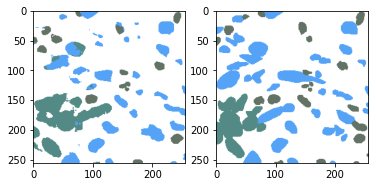

1


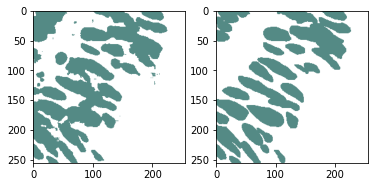

2


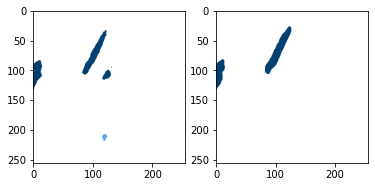

3


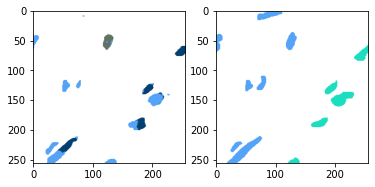

4


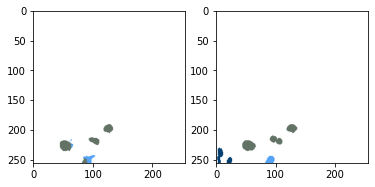

5


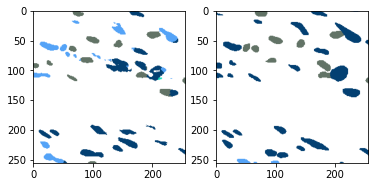

6


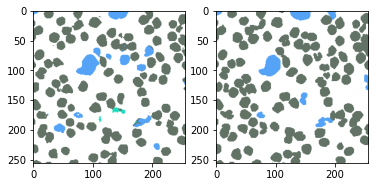

7


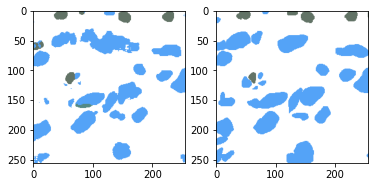

8


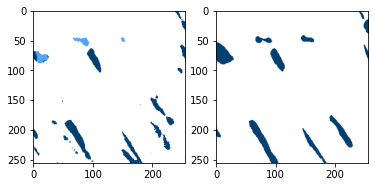

9


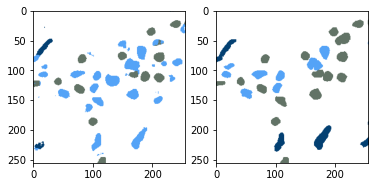

10


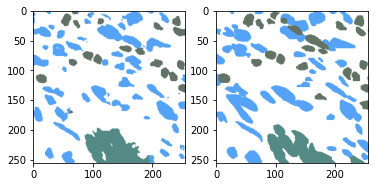

11


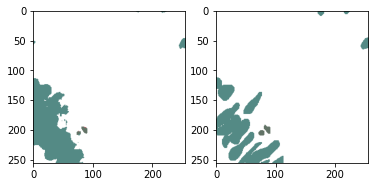

12


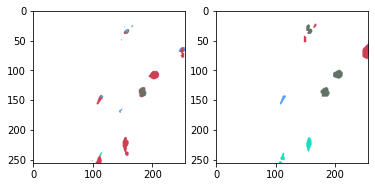

13


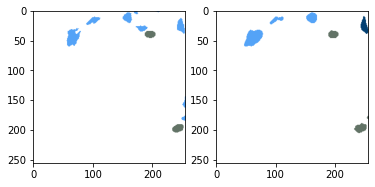

14


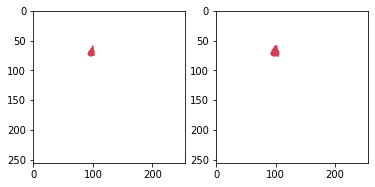

15


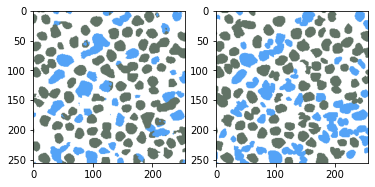

16


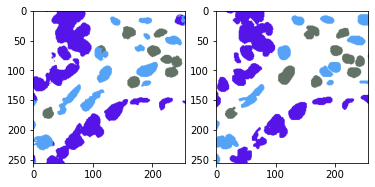

17


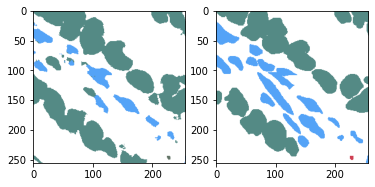

18


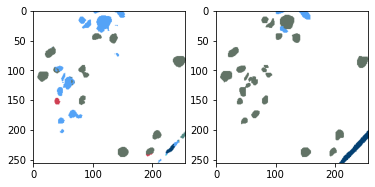

19


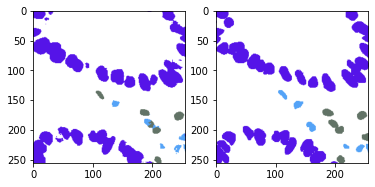

20


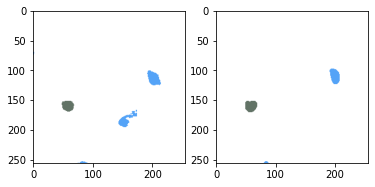

21


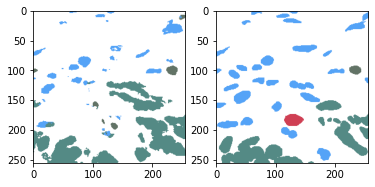

22


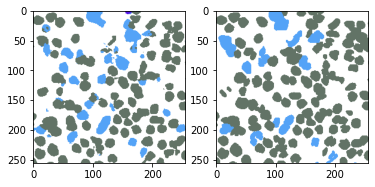

23


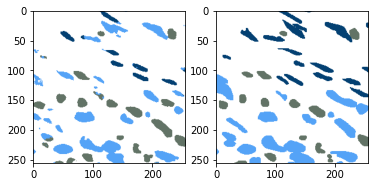

24


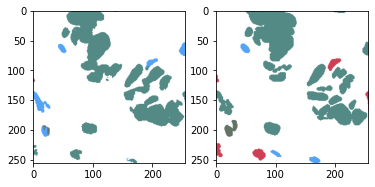

25


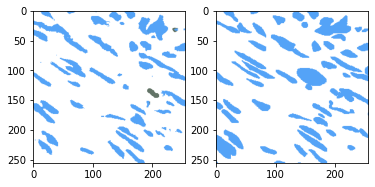

26


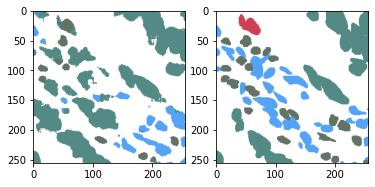

27


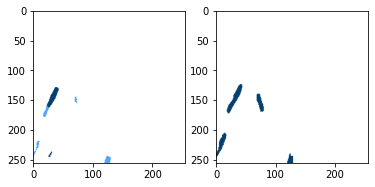

28


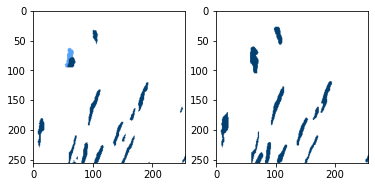

29


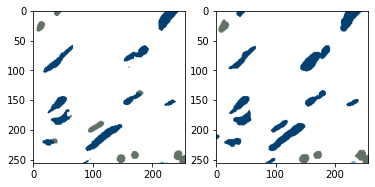

30


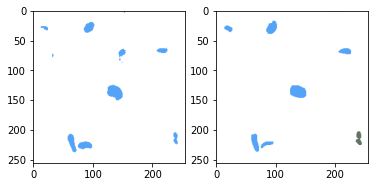

31


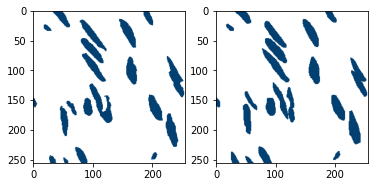

32


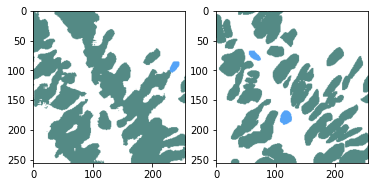

33


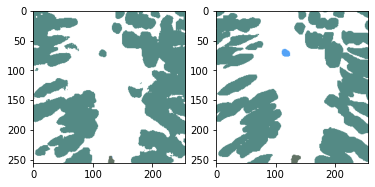

34


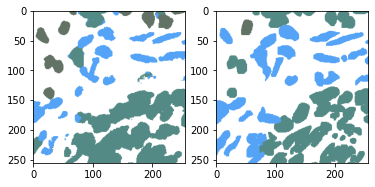

35


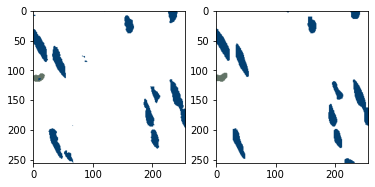

36


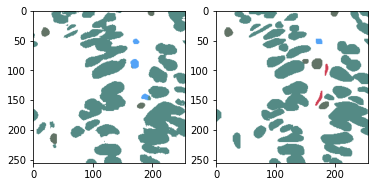

37


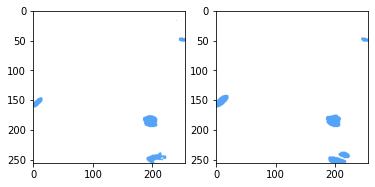

38


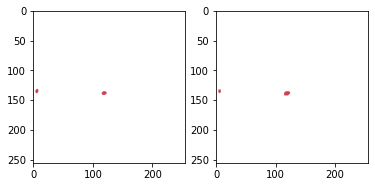

39


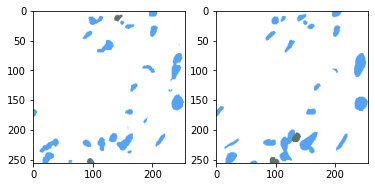

40


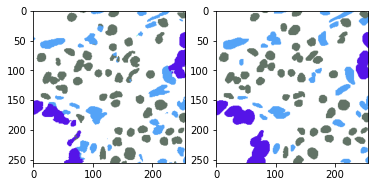

41


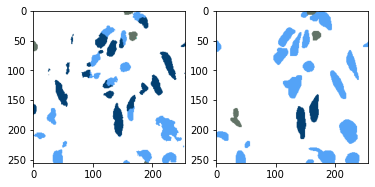

42


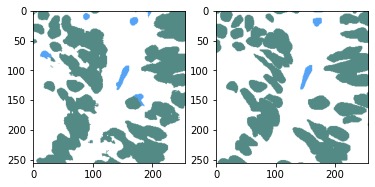

43


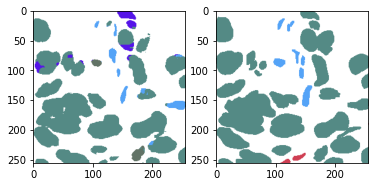

44


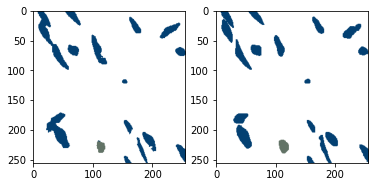

45


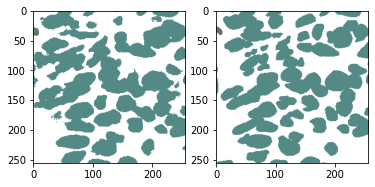

46


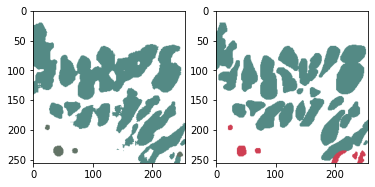

47


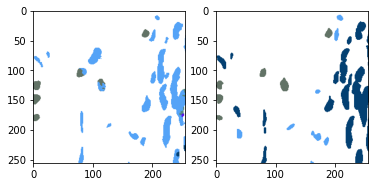

48


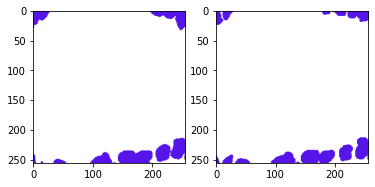

49


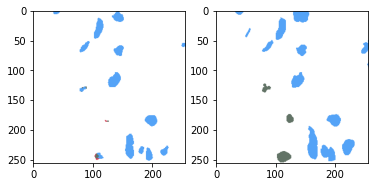

50


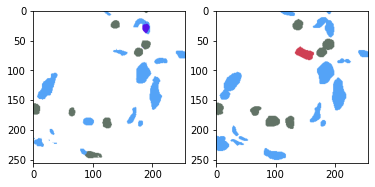

51


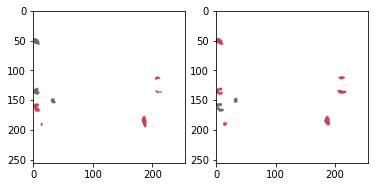

52


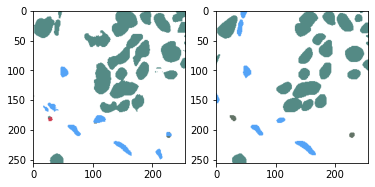

53


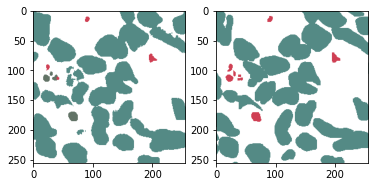

54


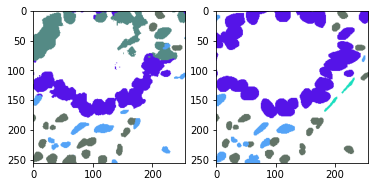

55


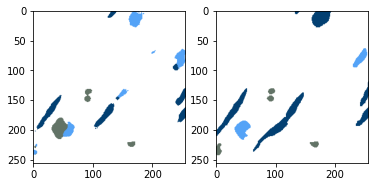

56


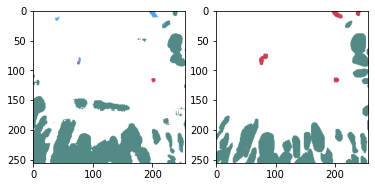

57


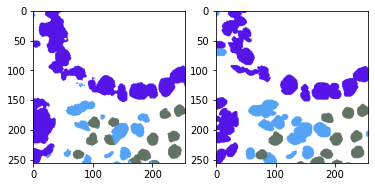

58


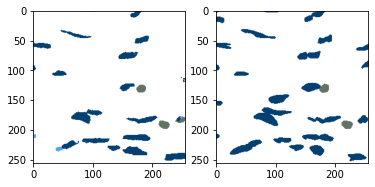

59


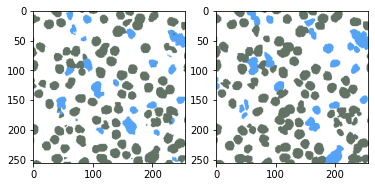

60


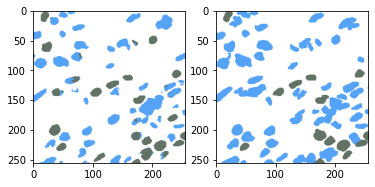

61


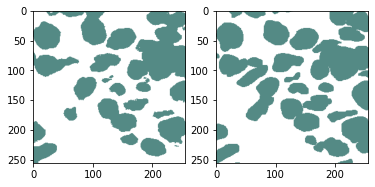

62


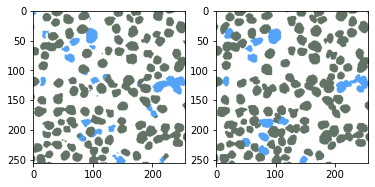

63


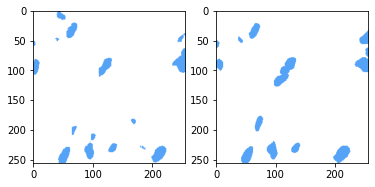

64


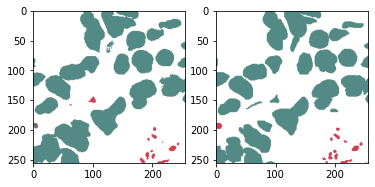

65


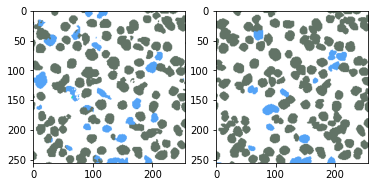

66


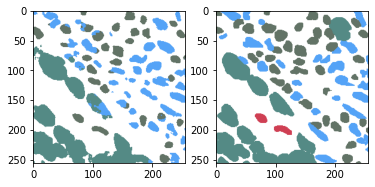

67


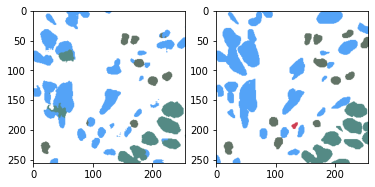

68


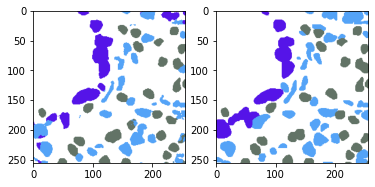

69


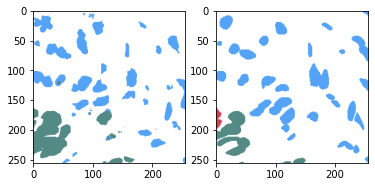

70


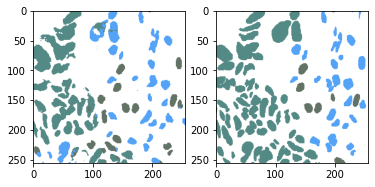

71


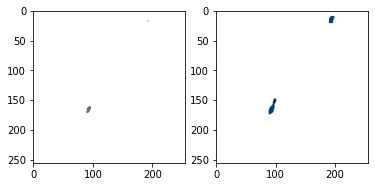

72


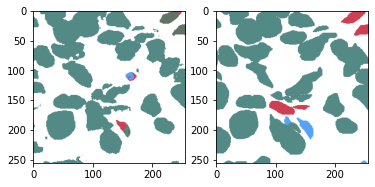

73


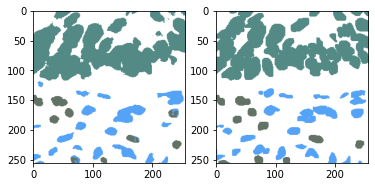

In [ ]:
import time
count = 0
for i in range(preds.shape[0]):
    print(count)
    # one = to_categorical(.argmax(-1), num_classes=8)
    x = onehot_to_rgb(preds[i])
    ori_one = to_categorical(original[i].argmax(-1), num_classes= 8)
    y = onehot_to_rgb(ori_one)
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(x)
    
    ax[1].imshow(y)
    plt.show()
    cv2.imwrite('/content/drive/Shareddrives/Classification/consep/onkar_final_model/original_png/{}.png'.format(i), y)
    cv2.imwrite('/content/drive/Shareddrives/Classification/consep/onkar_final_model/pred_png/{}.png'.format(i), x)
    count += 1
    
    # time.sleep(1000)


In [ ]:
!rm -rf /content/drive/Shareddrives/Classification/consep/onkar_final_model/test_images

In [ ]:

for k, i in enumerate(preds):
    i = onehot_to_rgb(i).astype(np.uint8)
    cv2.imwrite('/content/drive/Shareddrives/Classification/consep/onkar_final_model/png_pred/pred_{}.png'.format(k), i)
    

In [ ]:
for k, i in enumerate(original):
    i = onehot_to_rgb(i).astype(np.int8)
    cv2.imwrite('/content/drive/Shareddrives/Classification/consep/onkar_final_model/png_original/original_{}.png'.format(k), i)

In [ ]:
for i, data in enumerate(test_ds):
    cv2.imwrite('/content/drive/Shareddrives/Classification/consep/onkar_final_model/test_images/images_{}.png'.format(i), data[0][0])


# Metrics

In [ ]:
from sklearn.metrics import f1_score
import sklearn

In [ ]:
y_true = np.load('/content/drive/Shareddrives/Classification/consep/onkar_final_model/original.npy')
y_pred = np.load('/content/drive/Shareddrives/Classification/consep/onkar_final_model/predection.npy')

F1-Score

In [ ]:
y_true.dtype, y_pred.dtype

(dtype('float32'), dtype('float32'))

In [ ]:
f1_score(y_true.flatten(), y_pred.flatten())

0.9192843050570101

IOU

In [ ]:
m = tf.keras.metrics.MeanIoU(num_classes=8)
m.update_state(y_true, y_pred)
m.result().numpy()

0.9030211

ROC_AUC

In [ ]:

sklearn.metrics.roc_auc_score(y_true.flatten(), y_pred.flatten())

0.953876745746863